In [1]:
%load_ext autoreload
%autoreload 2

import os
import sys
import numpy as np
import pandas as pd
import librosa as lr
import librosa.display as lrd
import matplotlib.pyplot as plt
import IPython.display as ipd

from pathlib import Path

from utils.data import TimeFrame, TimeSeries, UniformSeries, EventSeries
from plots.timeframe import plot_timeframe
from plots.timeframe.renderers import make_spectrogram_series

from models.rps_predictor import SimpleConvV2

In [227]:
def _load_michaels_data_raw(wav_path, csv_path, time_offset = 0.0, time_dilation = 1.0, sr=None):
    wav, sample_rate = lr.load(wav_path, sr=sr, mono=False)
    if len(wav.shape) == 1:
        wav = wav[None, :]
    
    csv = pd.read_csv(csv_path)
    ms_cols = [c for c in csv.columns if 'Motor' in c][:4]
    t_col = 'Clock:offsetTime'
    small_csv = csv[[t_col] + ms_cols]
    
    wav_duration = wav.shape[-1] / sample_rate
    cut_csv = small_csv[(small_csv[t_col] >= time_offset) & (small_csv[t_col] <= wav_duration + time_offset)]
    ts = cut_csv[t_col].values
    
    if ts[0] > time_offset:
        print(ts[0] - time_offset)
        wav = wav[:, int((ts[0] - time_offset) * sample_rate):]
        time_offset = ts[0]
        wav_duration = wav.shape[-1] / sample_rate        
    
    if ts[-1] < wav_duration + time_offset:
        wav = wav[:, :int((ts[-1] - ts[0])*sample_rate)]

    jump_idx = np.argmax(np.diff(ts))
    print(jump_idx)
    # ts = np.linspace(ts[0], ts[-1], len(ts))
    ts[0:jump_idx+2] = np.linspace(ts[0], ts[jump_idx+2], jump_idx+2)
    ts *= time_dilation
    
    ms = cut_csv[ms_cols].values.T / 60
    return wav, ts, ms, sample_rate

In [230]:
def display_michaels_data(
    wav_path,
    csv_path,
    time_offset=0.0,
    time_dilation=1.0,
    sr=None,
    display_offset=0.0,
    display_duration=10.0,
    channel=0,
):
    wav, ts, ms, sr = _load_michaels_data_raw(
        wav_path,
        csv_path,
        time_offset=time_offset,
        time_dilation=time_dilation,
        sr=sr,
    )
    print(wav.shape)
    print(ts.shape)
    print(ms.shape)
    print(sr)

    audio = UniformSeries.from_samples(samples=wav[channel], sr=sr)
    spec = make_spectrogram_series(audio, fmax=None)
    tf = TimeFrame.from_tracks(dict(
        audio=audio,
        audio_spectrogram=spec,
        rps=EventSeries.from_events(timestamps=ts, values=ms),
    ))

    print(ts)
    slc = tf.slice(display_offset, display_offset+display_duration)
    _ = plot_timeframe(slc)

20.684
3203
(8, 1944864)
(3564,)
(4, 3564)
16000
[-1.56156000e-01 -1.21968913e-01 -8.77818265e-02 ...  1.21452331e+02
  1.21486365e+02  1.21519398e+02]


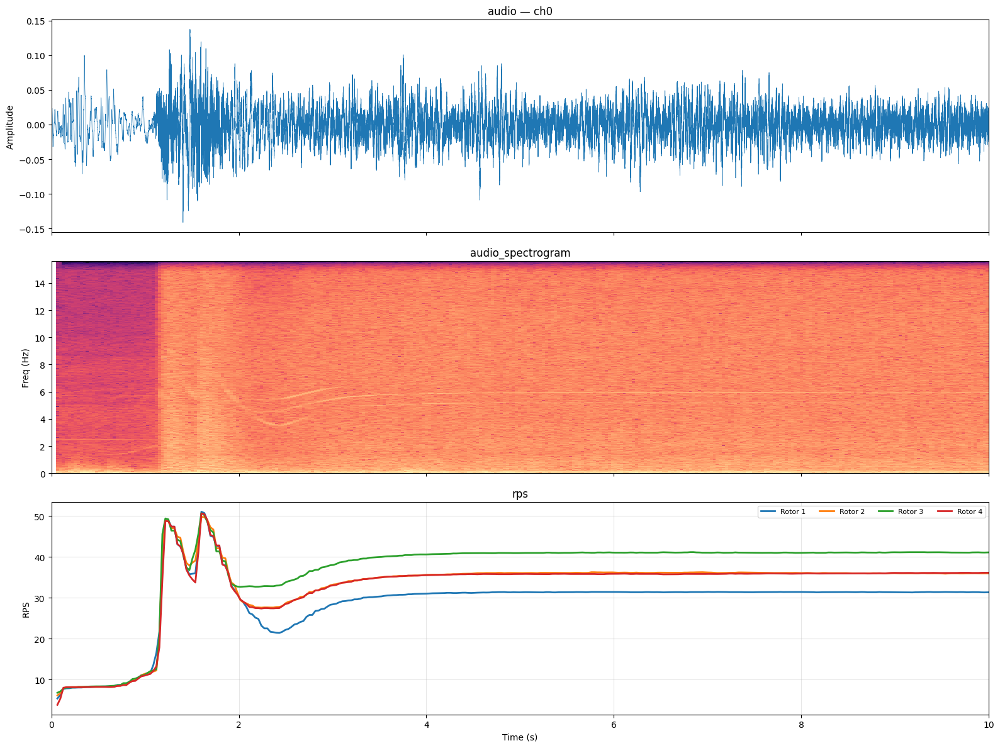

In [231]:
display_michaels_data(
    '../data/recording_with_motor_speed/recording_1/124.wav',
    '../data/recording_with_motor_speed/recording_1/FLY124.csv',
    time_offset=-20.84,
    time_dilation=1.001,
    sr=16000,
    display_offset=0.0,
    display_duration=10.0,
)

/tmp/ipykernel_3328996/2274452054.py:6: DtypeWarning: Columns (49,50,211,215,216,217,227) have mixed types. Specify dtype option on import or set low_memory=False.
  csv = pd.read_csv(csv_path)


26.372
5103
(8, 2840512)
(5211,)
(4, 5211)
16000
[-1.38662400e-01 -1.04412382e-01 -7.01623649e-02 ...  1.78178170e+02
  1.78211328e+02  1.78245491e+02]


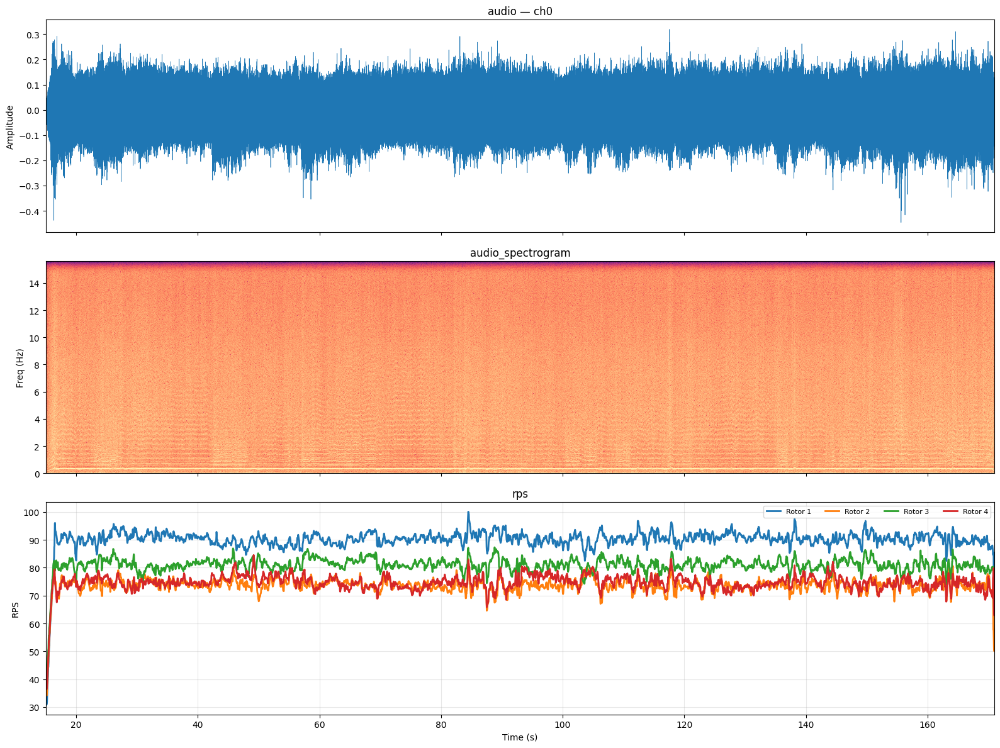

In [241]:
display_michaels_data(
    '../data/recording_with_motor_speed/recording_2/125.wav',
    '../data/recording_with_motor_speed/recording_2/FLY125.csv',
    time_offset=-26.51,
    time_dilation=1.0048,
    sr=16000,
    display_offset=15.0,
    display_duration=156.0
)

/tmp/ipykernel_3328996/2274452054.py:6: DtypeWarning: Columns (49,50,211,215,216,217,227) have mixed types. Specify dtype option on import or set low_memory=False.
  csv = pd.read_csv(csv_path)


0.031
3042
(1, 1702608)
(3109,)
(4, 3109)
16000


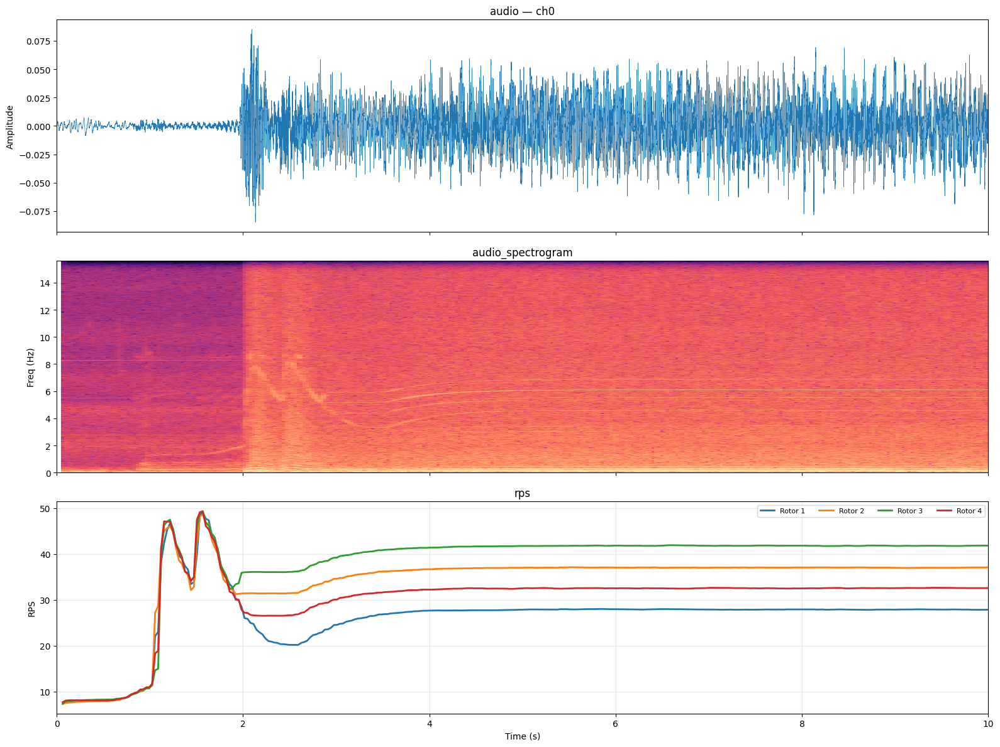

In [229]:
display_michaels_data(
    '../data/new-drone-noises/103_2.wav',
    '../data/new-drone-noises/FLY103.csv',
    time_offset=0.0,
    time_dilation=1.00,
    sr=16000,
    display_offset=0.0,
    display_duration=10.0
)

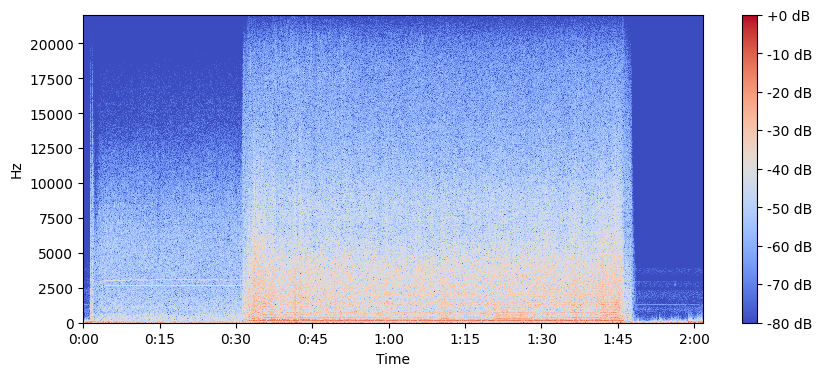

In [56]:
D = np.abs(lr.stft(wav[0]))
D_db = lr.amplitude_to_db(D, ref=np.max)

plt.figure(figsize=(10, 4))
lrd.specshow(D_db, sr=sr, x_axis='time', y_axis='linear', cmap='coolwarm')
plt.colorbar(format='%+2.0f dB')
plt.show()

In [43]:
ipd.display(ipd.Audio(data=wav[0], rate=sr))

In [33]:
df = pd.read_csv('../data/recording_with_motor_speed/recording_1/FLY124.csv')
df

,Clock:Tick#,Clock:offsetTime,IMU_ATTI(0):Longitude,IMU_ATTI(0):Latitude,IMU_ATTI(0):press:D,IMU_ATTI(0):alti:D,IMU_ATTI(0):relativeHeight:C,IMU_ATTI(0):absoluteHeight:C,IMU_ATTI(0):numSats,IMU_ATTI(0):roll:C,...,osd_data:vpsHeight,osd_data:relativeHeight,MotorCtrl:Status,MotorCtrl:PWM:RFront,MotorCtrl:PWM:LFront,MotorCtrl:PWM:LBack,MotorCtrl:PWM:RBack,Attribute|Value,ConvertDatV3,4.2.1
0,0,-211.806,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,17990217821,-0.156,0.626111,51.534353,-74.60890,-75.25510,NaN,NaN,18.0,-1.719849,...,NaN,0.0,NaN,NaN,NaN,NaN,NaN,Firmware Date| Jul 13 2018,NaN,NaN
2,17993068197,-0.123,0.626111,51.534353,-74.51032,-75.25486,0.744773,NaN,18.0,-1.721049,...,NaN,0.0,1.0,0.15,0.15,0.15,0.15,ACType|M100,NaN,NaN
3,17995904175,-0.089,0.626111,51.534353,-74.45421,-75.25482,0.800888,NaN,18.0,-1.722981,...,NaN,0.0,1.0,0.46,0.46,0.46,0.46,mcID(SN)|041DE70827,NaN,NaN
4,17998737951,-0.056,0.626111,51.534353,-74.64980,-75.25479,0.605293,NaN,18.0,-1.723422,...,NaN,0.0,1.0,0.77,0.77,0.77,0.77,mcVer|v3.1.6.108,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3977,29511548453,135.389,0.626109,51.534352,-74.01112,-75.23060,1.515808,NaN,17.0,-0.324067,...,NaN,0.0,2.0,14.67,17.82,21.15,20.05,NaN,NaN,NaN
3978,29514488455,135.423,0.626109,51.534352,-74.28274,-75.22980,1.244194,NaN,17.0,-0.323406,...,NaN,0.0,2.0,14.67,17.82,21.15,20.05,NaN,NaN,NaN
3979,29517322767,135.457,0.626109,51.534352,-74.15900,-75.22948,1.367935,NaN,17.0,-0.323316,...,NaN,0.0,2.0,14.67,17.82,21.15,20.05,NaN,NaN,NaN
3980,29520158453,135.490,0.626109,51.534352,-73.84071,-75.22897,1.686218,NaN,17.0,-0.322890,...,NaN,0.0,2.0,14.67,17.82,21.15,20.05,NaN,NaN,NaN


In [35]:
list(df.columns)

['Clock:Tick#',
 'Clock:offsetTime',
 'IMU_ATTI(0):Longitude',
 'IMU_ATTI(0):Latitude',
 'IMU_ATTI(0):press:D',
 'IMU_ATTI(0):alti:D',
 'IMU_ATTI(0):relativeHeight:C',
 'IMU_ATTI(0):absoluteHeight:C',
 'IMU_ATTI(0):numSats',
 'IMU_ATTI(0):roll:C',
 'IMU_ATTI(0):pitch:C',
 'IMU_ATTI(0):yaw:C',
 'IMU_ATTI(0):accelX',
 'IMU_ATTI(0):accelY',
 'IMU_ATTI(0):accelZ',
 'IMU_ATTI(0):accelComposite:C',
 'IMU_ATTI(0):gyroX',
 'IMU_ATTI(0):gyroY',
 'IMU_ATTI(0):gyroZ',
 'IMU_ATTI(0):gyroComposite:C',
 'IMU_ATTI(0):velN',
 'IMU_ATTI(0):velE',
 'IMU_ATTI(0):velD',
 'IMU_ATTI(0):velComposite:C',
 'IMU_ATTI(0):velH:C',
 'IMU_ATTI(0):magX',
 'IMU_ATTI(0):magY',
 'IMU_ATTI(0):magZ',
 'IMU_ATTI(0):magMod:C',
 'IMU_ATTI(0):temperature',
 'IMU_ATTI(0):yawUnWrapped:C',
 'IMU_ATTI(0):tiltInclination:C',
 'IMU_ATTI(0):tiltDirectionEarthFrame:C',
 'IMU_ATTI(0):tiltDirectionBodyFrame:C',
 'IMU_ATTI(0):yaw360:C',
 'IMU_ATTI(0):magYaw:C',
 'IMU_ATTI(0):Yaw-magYaw:C',
 'IMUCalcs(0):PosN:C',
 'IMUCalcs(0):PosE:C',


In [36]:
ms_cols = [col for col in df.columns if col.startswith('Motor:Speed')]
ms_cols

['Motor:Speed:RFront',
 'Motor:Speed:LFront',
 'Motor:Speed:LBack',
 'Motor:Speed:RBack']

In [39]:
t_col = 'Clock:offsetTime'
small_df = df[[t_col] + ms_cols]
small_df

,Clock:offsetTime,Motor:Speed:RFront,Motor:Speed:LFront,Motor:Speed:LBack,Motor:Speed:RBack
0,-211.806,NaN,NaN,NaN,NaN
1,-0.156,0.0,0.0,0.0,0.0
2,-0.123,0.0,0.0,0.0,0.0
3,-0.089,0.0,2.0,8.0,0.0
4,-0.056,0.0,2.0,8.0,0.0
...,...,...,...,...,...
3977,135.389,0.0,0.0,-1.0,0.0
3978,135.423,0.0,0.0,-1.0,0.0
3979,135.457,0.0,0.0,-1.0,0.0
3980,135.490,0.0,0.0,-1.0,0.0


In [38]:
MICHAELS_FILES = [
    # ("103_2.wav", "FLY103.csv", -0.94, 12.0, 100.0),
    # ("108_2.wav", "FLY108.csv", -0.40, 9.0, 88.0),
    ("124.wav", "FLY124.csv", -20.63, 33.0, 105.0),
    ("125.wav", "FLY125.csv", -26.27, 17.0, 170.0),
]

In [81]:
tick_col = 'Clock:Tick#'

In [90]:
ticks = df[tick_col][1:]
times = df[t_col][1:]

In [92]:
np.diff(times)

array([0.033, 0.034, 0.033, ..., 0.034, 0.033, 0.034], shape=(3980,))

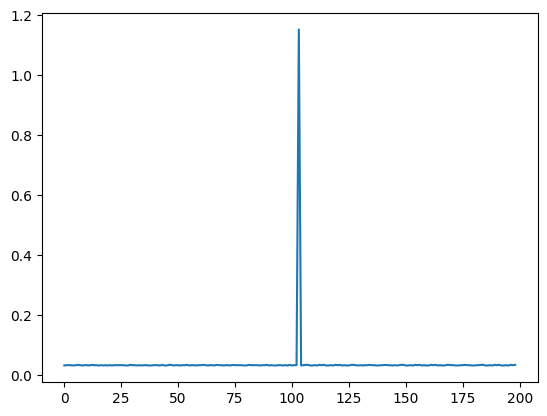

In [96]:
plt.plot(np.arange(199), np.diff(times[3100:3300]))

In [97]:
times[3200:3300]

3201    107.983
3202    108.016
3203    108.050
3204    108.084
3205    109.237
         ...   
3296    112.320
3297    112.353
3298    112.388
3299    112.422
3300    112.457
Name: Clock:offsetTime, Length: 100, dtype: float64

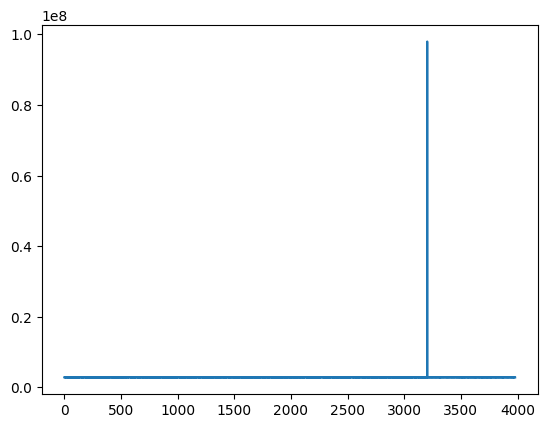

In [94]:
plt.plot(np.arange(len(ticks)-1), np.diff(ticks))